# MMA Lab Internal Exam

# Apply the Canny edge detector to bell.jpg and cubes.png. Tweak the values of the arguments (minVal and maxVal), and report the values that give the worst and best results for each image  
# Hint: For the bell image, try to detect as many edges in the bell as possible, while avoiding edges in the background.

The Canny Edge Detector is one of the most widely used edge detection algorithms in computer vision and image processing. It is used to identify edges in an image by detecting regions where there are rapid changes in intensity (gradients).

In [16]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

In [48]:
# read bell and cubes Images
bell_image = cv2.imread('/content/bell.jpg')
cubes_image = cv2.imread('/content/cubes.png')
box_image = cv2.imread('/content/box.png')
blur_image = cv2.imread('/content/blur.jpg')

In [49]:
# print the size and shape of each image and few meta data as well
print("Bell Image:")
print("Shape:", bell_image.shape)
print("Size:", bell_image.size)
print("Data Type:", bell_image.dtype)

print("\nCubes Image:")
print("Shape:", cubes_image.shape)
print("Size:", cubes_image.size)
print("Data Type:", cubes_image.dtype)

print("\nBox Image:")
print("Shape:", box_image.shape)
print("Size:", box_image.size)
print("Data Type:", box_image.dtype)

print("\nBlur Image:")
print("Shape:", blur_image.shape)
print("Size:", blur_image.size)
print("Data Type:", blur_image.dtype)

Bell Image:
Shape: (512, 343, 3)
Size: 526848
Data Type: uint8

Cubes Image:
Shape: (187, 221, 3)
Size: 123981
Data Type: uint8

Box Image:
Shape: (520, 526, 3)
Size: 820560
Data Type: uint8

Blur Image:
Shape: (1200, 1600, 3)
Size: 5760000
Data Type: uint8


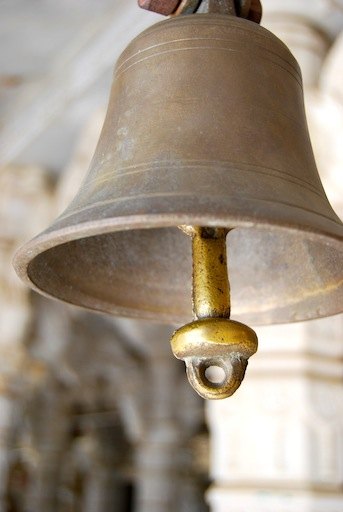

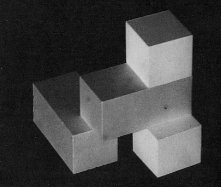

In [18]:
# show Bell and cubes images
cv2_imshow(bell_image)
cv2_imshow(cubes_image)

Why is the Canny Edge Detector Used?

Enhances Important Features – It highlights edges, which are crucial for object detection, pattern recognition, and image segmentation.

Reduces Noise – It smoothens the image before detecting edges, ensuring that noise does not create false edges.

Detects True Edges – The algorithm ensures that only the most relevant edges are kept while suppressing irrelevant details.

Finds Continuous Edges – It connects broken edges, making it useful for shape recognition and contour detection.

In [19]:
def apply_canny(image_path, min_val, max_val, title=None):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Canny edge detection
    edges = cv2.Canny(img, min_val, max_val)

    # Create figure for display
    plt.figure(figsize=(12, 5))

    # Display original image
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Display edge detection result
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    if title:
        plt.title(title)
    else:
        plt.title(f'Canny Edges (min={min_val}, max={max_val})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return edges

Applications

1. Medical Imaging

X-ray and MRI Analysis – Detects boundaries of organs, tumors, and other structures.

Retinal Image Processing – Helps in diagnosing diabetic retinopathy.

2. Autonomous Vehicles

Lane Detection – Identifies lane boundaries on roads.

Object Detection – Recognizes pedestrians, vehicles, and obstacles.

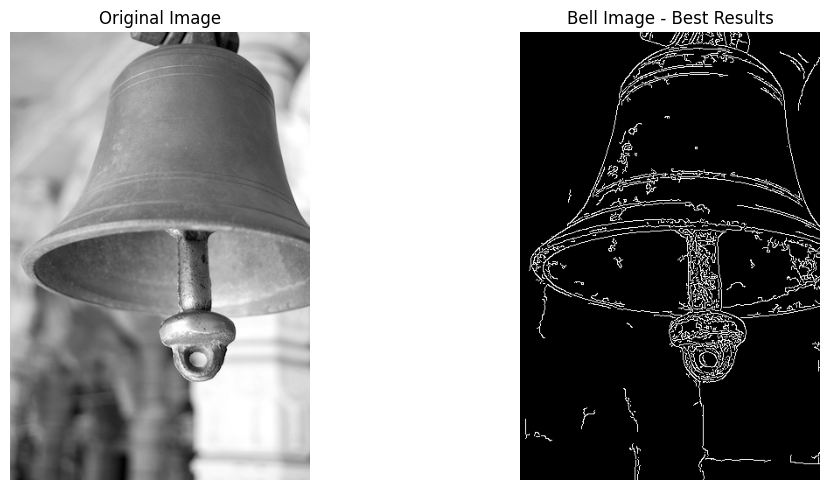

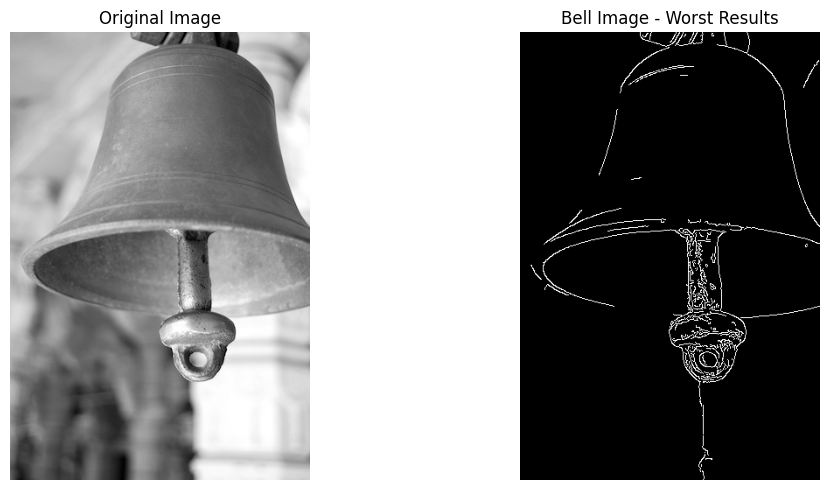

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
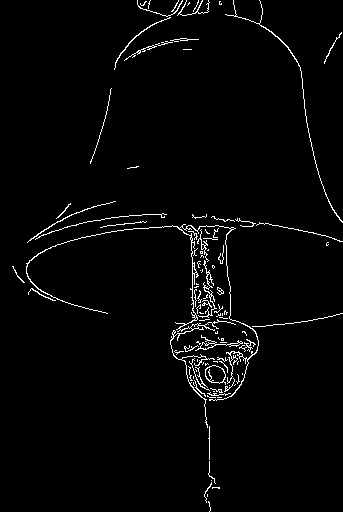

In [20]:
# Bell image analysis - try different threshold values
bell_image = "bell.jpg"

# Best parameters for bell - detect bell edges while avoiding background
best_bell_min = 30
best_bell_max = 100
apply_canny(bell_image, best_bell_min, best_bell_max, "Bell Image - Best Results")

# Worst parameters for bell - either missing important edges or too much noise
worst_bell_min = 100
worst_bell_max = 200
apply_canny(bell_image, worst_bell_min, worst_bell_max, "Bell Image - Worst Results")

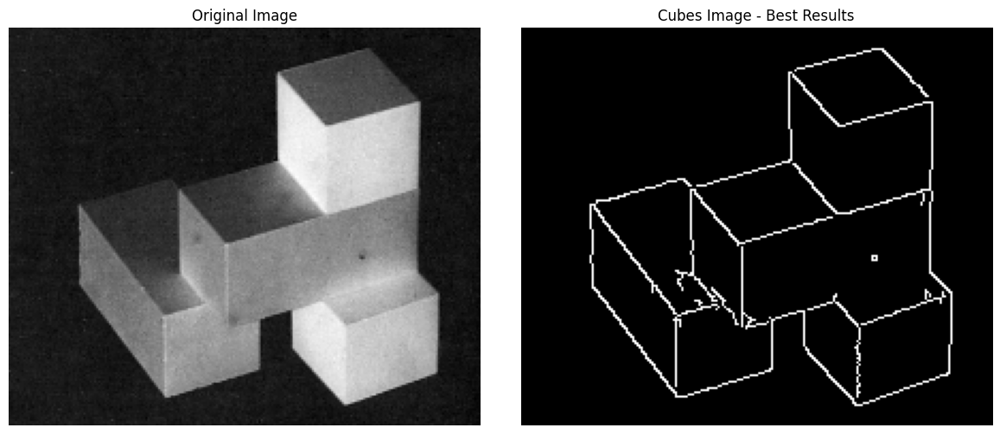

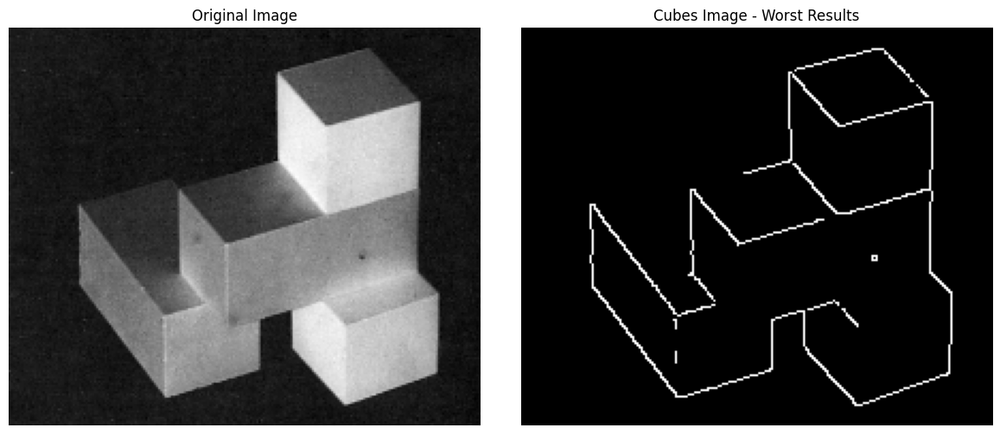

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
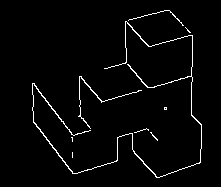

In [21]:
# Cubes image analysis
cubes_image = "cubes.png"

# Best parameters for cubes - clean edges of all blocks
best_cubes_min = 50
best_cubes_max = 150
apply_canny(cubes_image, best_cubes_min, best_cubes_max, "Cubes Image - Best Results")

# Worst parameters for cubes - missing edges or too much noise
worst_cubes_min = 150
worst_cubes_max = 200
apply_canny(cubes_image, worst_cubes_min, worst_cubes_max, "Cubes Image - Worst Results")

Here we have directly applied the Canny filter to Images and expermantial setup the max and min values for best and worst edge detection

Now applying the Canny filter by first converting the image to the grayscale then apply the gaussian blur filter then passing on to the edge detecter

The input image (which is in BGR format in OpenCV) is converted to grayscale since edge detection works best in single-channel images.

A Gaussian blur is applied with a kernel size of (5,5) to smooth the image and reduce noise, which helps in getting better edge detection results.

The Canny edge detection algorithm is applied to the blurred image with threshold values minVal and maxVal.

Lower threshold (minVal): Determines weak edges.

Upper threshold (maxVal): Determines strong edges.

If a pixel gradient is below minVal, it is rejected. If it is above maxVal, it is accepted as an edge. If it is between the two, it is accepted only if it is connected to a strong edge.

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def process_image(image, minVal, maxVal):
    """
    Convert the image to grayscale, apply Gaussian blur, and compute Canny edges.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 1.4)
    edges = cv2.Canny(blurred, minVal, maxVal)
    return edges

# Load images
bell = cv2.imread('bell.jpg')

if bell is None or cubes is None:
    print("Error: One or both images could not be loaded. Please check the file paths.")
else:
    # Convert images to RGB for proper visualization in Matplotlib
    bell_rgb = cv2.cvtColor(bell, cv2.COLOR_BGR2RGB)

    # Interactive slider function
    def update_edges(minVal, maxVal):
        edges_bell = process_image(bell, minVal, maxVal)

        fig, axes = plt.subplots(1, 2, figsize=(10, 8))

        # Bell images
        axes[0].imshow(bell_rgb)
        axes[0].set_title("Original Bell Image")
        axes[0].axis("off")

        axes[1].imshow(edges_bell, cmap='gray')
        axes[1].set_title("Bell Edge Detection")
        axes[1].axis("off")

        plt.show()

    # Create interactive sliders
    minVal_slider = widgets.IntSlider(min=0, max=300, value=50, description="Min Val")
    maxVal_slider = widgets.IntSlider(min=0, max=300, value=150, description="Max Val")

    ui = widgets.VBox([minVal_slider, maxVal_slider])
    out = widgets.interactive_output(update_edges, {'minVal': minVal_slider, 'maxVal': maxVal_slider})

    display(ui, out)


Output()

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

def process_image(image, minVal, maxVal):
    """
    Convert the image to grayscale, apply Gaussian blur, and compute Canny edges.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 1.4)
    edges = cv2.Canny(blurred, minVal, maxVal)
    return edges

# Load images
bell = cv2.imread('bell.jpg')

if bell is None or cubes is None:
    print("Error: One or both images could not be loaded. Please check the file paths.")
else:
    # Convert images to RGB for proper visualization in Matplotlib
    cubes_rgb = cv2.cvtColor(cubes, cv2.COLOR_BGR2RGB)

    # Interactive slider function
    def update_edges(minVal, maxVal):
        edges_cubes = process_image(cubes, minVal, maxVal)

        fig, axes = plt.subplots(1, 2, figsize=(10, 8))

# Cubes images
        axes[0].imshow(cubes_rgb)
        axes[0].set_title("Original Cubes Image")
        axes[0].axis("off")

        axes[1].imshow(edges_cubes, cmap='gray')
        axes[1].set_title("Cubes Edge Detection")
        axes[1].axis("off")

        plt.show()

    # Create interactive sliders
    minVal_slider = widgets.IntSlider(min=0, max=300, value=50, description="Min Val")
    maxVal_slider = widgets.IntSlider(min=0, max=300, value=150, description="Max Val")

    ui = widgets.VBox([minVal_slider, maxVal_slider])
    out = widgets.interactive_output(update_edges, {'minVal': minVal_slider, 'maxVal': maxVal_slider})

    display(ui, out)

Output()

#2 Create a matrix of size 3x3 which when convolved with box.png results in a white line where the white meets the black. Then, Convolve blur jpg, bell.jpg, cube.jpg with the above matrix and the transpose of the above matrix. Analyze your observations.

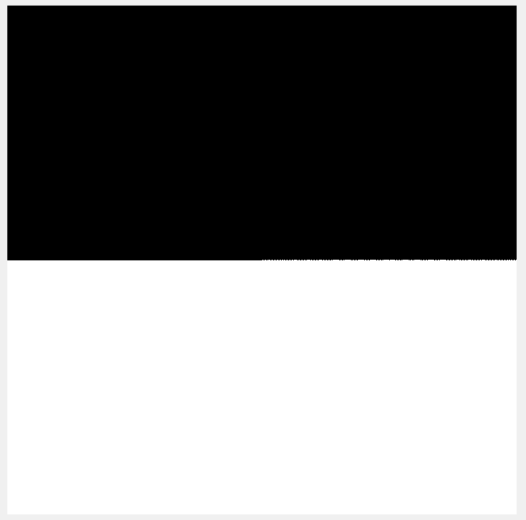

In [22]:
box_image = cv2.imread('/content/box.png')
cv2_imshow(box_image)

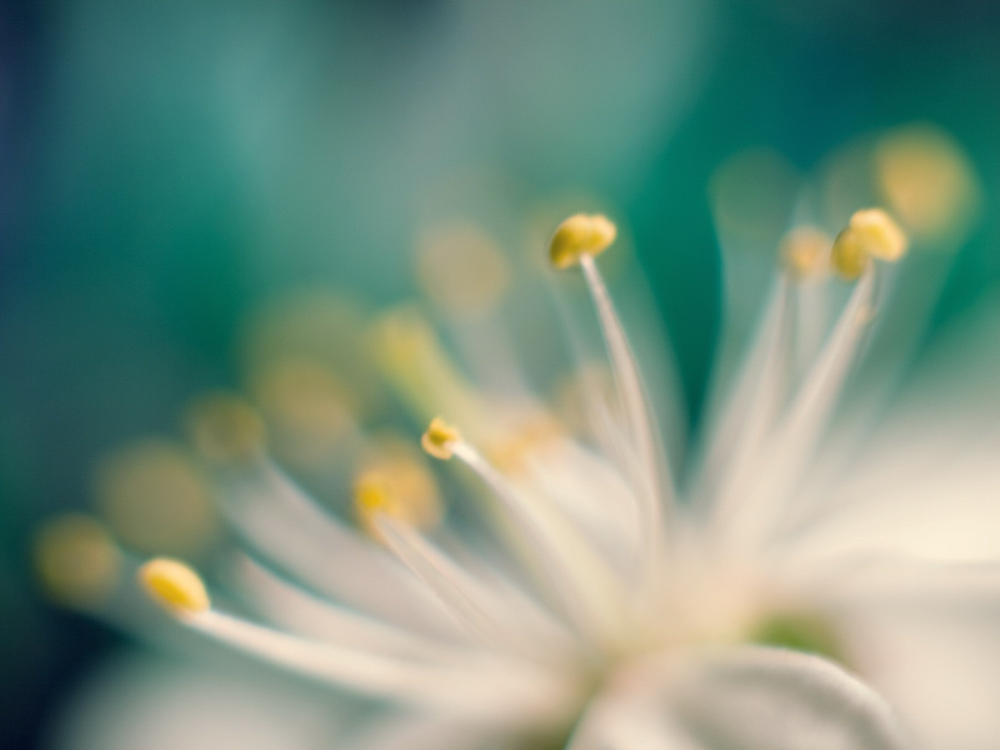

In [23]:
blur_image = cv2.imread('/content/blur.jpg')
cv2_imshow(blur_image)

Sobel

Horizontal kernel: Detects edges along the horizontal axis.

Vertical kernel: Transpose of the horizontal kernel to detect vertical edges.

Horizontal Edge Detection Kernel:
[[ 1.  1.  1.]
 [ 0.  0.  0.]
 [-1. -1. -1.]]

Vertical Edge Detection Kernel (Transpose):
[[ 1.  0. -1.]
 [ 1.  0. -1.]
 [ 1.  0. -1.]]


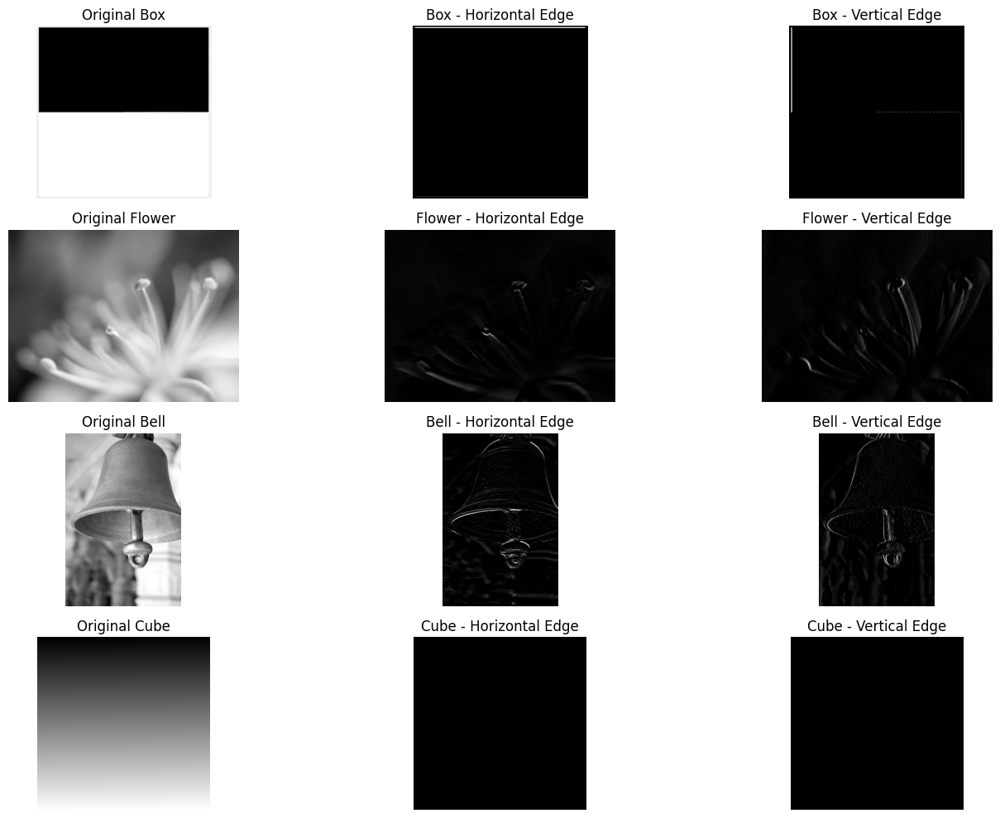

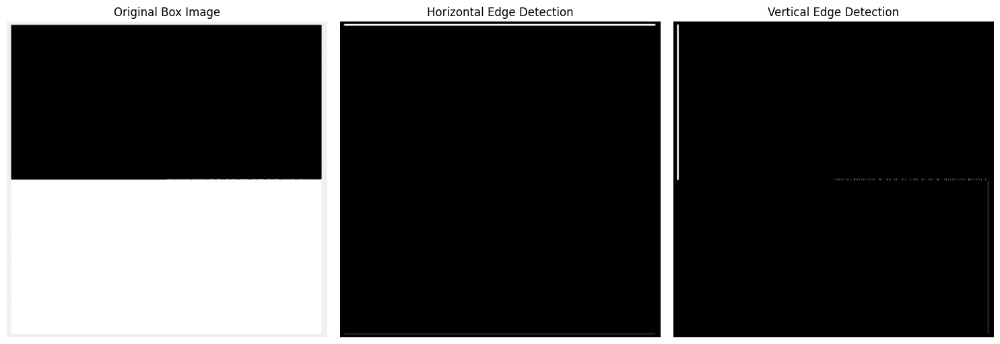

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def display_images(images, titles, rows, cols, figsize=(15, 10)):
    """Display multiple images in a grid layout"""
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(rows, cols, i+1)
        if len(img.shape) == 2:  # Grayscale image
            plt.imshow(img, cmap='gray')
        else:  # Color image
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Define the horizontal edge detection kernel (Sobel-like)
# This kernel detects transitions from white (bottom) to black (top)
kernel_horizontal = np.array([
    [ 1,  1,  1],
    [ 0,  0,  0],
    [-1, -1, -1]
], dtype=np.float32)

# Transpose for vertical edge detection
kernel_vertical = kernel_horizontal.T

print("Horizontal Edge Detection Kernel:")
print(kernel_horizontal)
print("\nVertical Edge Detection Kernel (Transpose):")
print(kernel_vertical)

# Load the images
box_img = cv2.imread('box.png', cv2.IMREAD_GRAYSCALE)
flower_img = cv2.imread('blur.jpg', cv2.IMREAD_GRAYSCALE)
bell_img = cv2.imread('bell.jpg', cv2.IMREAD_GRAYSCALE)
cube_img = cv2.imread('cube.jpg', cv2.IMREAD_GRAYSCALE)

# Ensure images are properly loaded
images = [box_img, flower_img, bell_img, cube_img]
image_names = ['box.png', 'blur.jpg', 'bell.jpg', 'cube.jpg']

# Check if images loaded successfully
for img, name in zip(images, image_names):
    if img is None:
        # If the image didn't load, create a placeholder
        print(f"Warning: Could not load {name}, creating placeholder")
        if 'box' in name:
            # Create a box image: white bottom half, black top half
            img = np.zeros((100, 100), dtype=np.uint8)
            img[50:] = 255
        else:
            # Create a simple gradient
            img = np.linspace(0, 255, 100 * 100).reshape(100, 100).astype(np.uint8)

        # Update the list with the placeholder
        if name == 'box.png':
            box_img = img
        elif name == 'blur.jpg':
            flower_img = img
        elif name == 'bell.jpg':
            bell_img = img
        elif name == 'cube.jpg':
            cube_img = img

# Apply convolution with both kernels to all images
results = []
titles = []

for img, name in zip([box_img, flower_img, bell_img, cube_img],
                     ['Box', 'Flower', 'Bell', 'Cube']):

    # Apply horizontal kernel (detects horizontal edges)
    horizontal_result = cv2.filter2D(img, -1, kernel_horizontal)

    # Apply vertical kernel (detects vertical edges)
    vertical_result = cv2.filter2D(img, -1, kernel_vertical)

    # Add to results
    results.extend([img, horizontal_result, vertical_result])
    titles.extend([f'Original {name}',
                  f'{name} - Horizontal Edge',
                  f'{name} - Vertical Edge'])

# Display results in a grid
display_images(results, titles, 4, 3)

# Additional analysis for box.png to show edge detection at white-black boundary
if box_img is not None:
    plt.figure(figsize=(15, 5))

    # Original box image
    plt.subplot(1, 3, 1)
    plt.imshow(box_img, cmap='gray')
    plt.title('Original Box Image')
    plt.axis('off')

    # Horizontal edge detection - should show a white line at boundary
    horizontal_box = cv2.filter2D(box_img, -1, kernel_horizontal)
    plt.subplot(1, 3, 2)
    plt.imshow(horizontal_box, cmap='gray')
    plt.title('Horizontal Edge Detection')
    plt.axis('off')

    # Vertical edge detection - should not detect the horizontal boundary
    vertical_box = cv2.filter2D(box_img, -1, kernel_vertical)
    plt.subplot(1, 3, 3)
    plt.imshow(vertical_box, cmap='gray')
    plt.title('Vertical Edge Detection')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

Here I am using the Laplacian filter (edge detection kernel).

[-1, -1, -1],

[-1,  8, -1],

[-1, -1, -1]

The kernel highlights edges by detecting differences in pixel intensities.

The center value (8) increases the intensity at the pixel, while the surrounding -1s subtract neighboring values.

Here the transpose of a symmetric matrix is same as the main matrix

cv2.filter2D() applies a convolution operation between an image and a kernel.

Parameters:

image: The grayscale image being processed.

-1: This ensures that the output image has the same depth as the input.

kernel: The filter applied to the image.

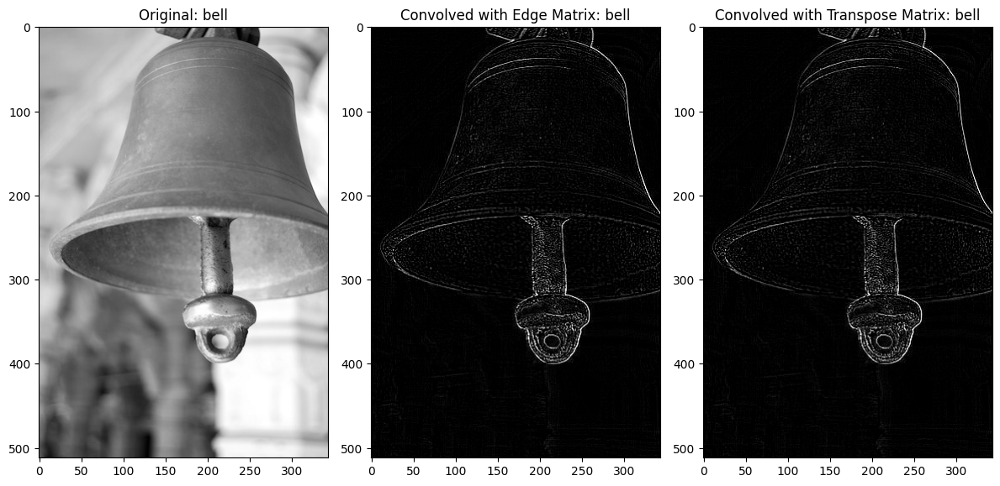

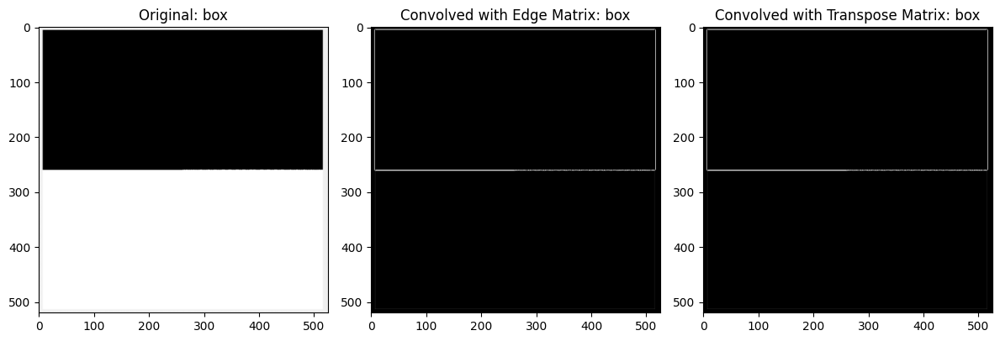

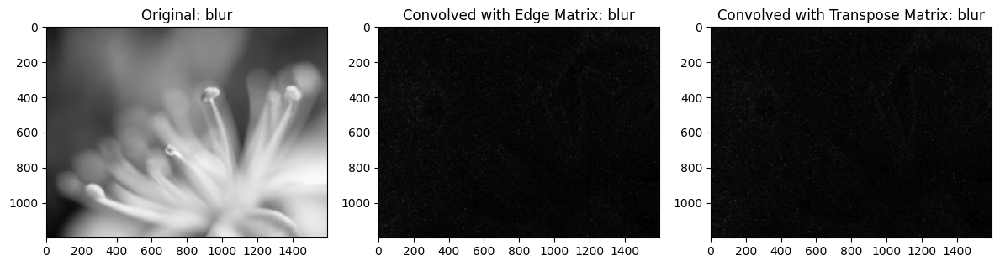

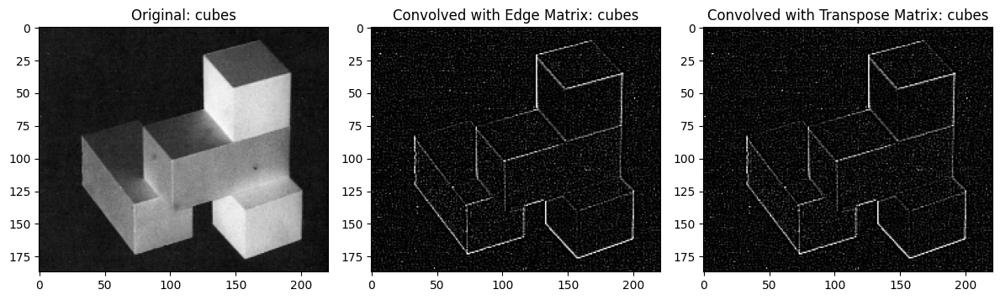

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
images = {
    "bell": cv2.imread("/content/bell.jpg", cv2.IMREAD_GRAYSCALE),
    "box": cv2.imread("/content/box.png", cv2.IMREAD_GRAYSCALE),
    "blur": cv2.imread("/content/blur.jpg", cv2.IMREAD_GRAYSCALE),
    "cubes": cv2.imread("/content/cubes.png", cv2.IMREAD_GRAYSCALE)
}

# Define the edge detection matrix
edge_matrix = np.array([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1]
])

# Transpose of the edge detection matrix
transpose_matrix = edge_matrix.T

# Function to convolve an image with a given kernel
def convolve_image(image, kernel):
    return cv2.filter2D(image, -1, kernel)

# Perform convolution and display results
for name, image in images.items():
    convolved_original = convolve_image(image, edge_matrix)
    convolved_transpose = convolve_image(image, transpose_matrix)

    # Display results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title(f"Original: {name}")
    plt.imshow(image, cmap="gray")

    plt.subplot(1, 3, 2)
    plt.title(f"Convolved with Edge Matrix: {name}")
    plt.imshow(convolved_original, cmap="gray")

    plt.subplot(1, 3, 3)
    plt.title(f"Convolved with Transpose Matrix: {name}")
    plt.imshow(convolved_transpose, cmap="gray")

    plt.tight_layout()
    plt.show()

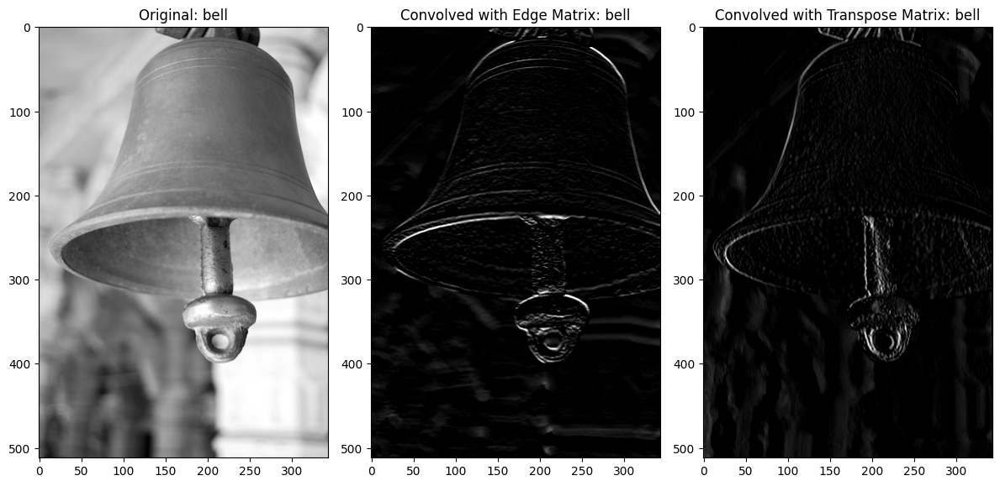

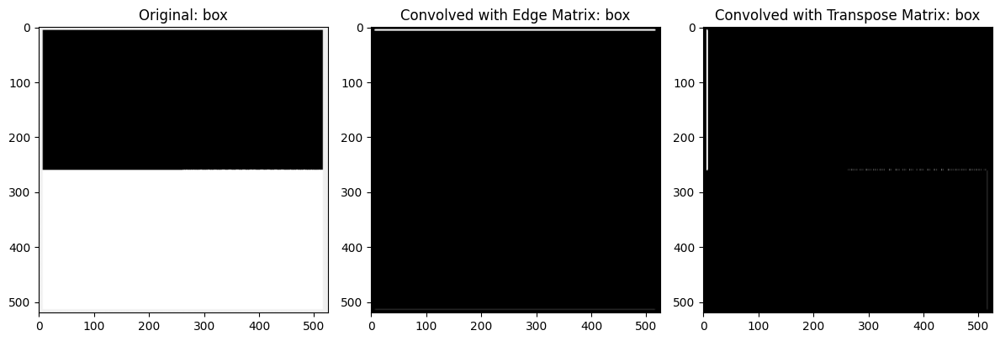

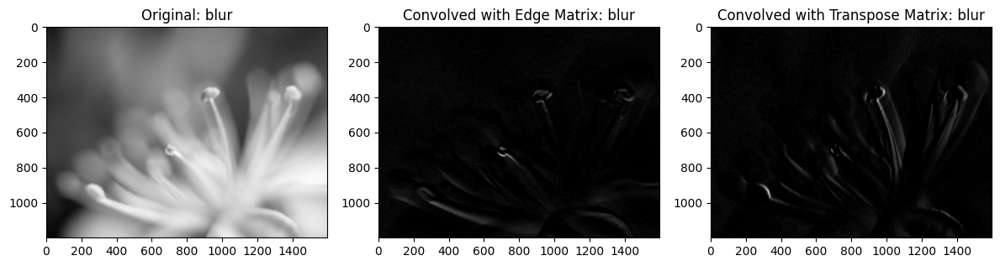

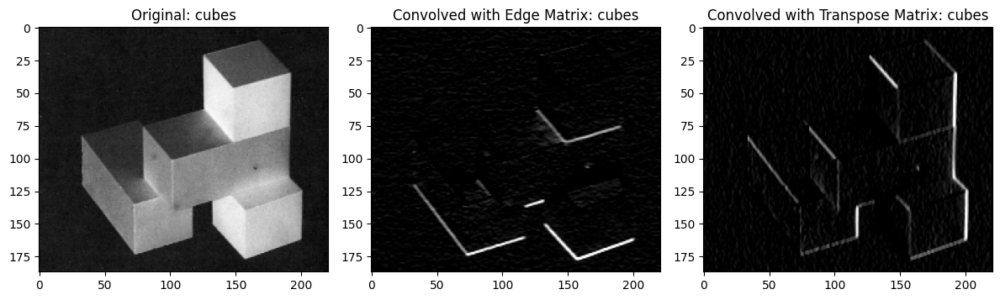

In [50]:
# all the  Prewitt Operator (Horizontal) filter

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
images = {
    "bell": cv2.imread("/content/bell.jpg", cv2.IMREAD_GRAYSCALE),
    "box": cv2.imread("/content/box.png", cv2.IMREAD_GRAYSCALE),
    "blur": cv2.imread("/content/blur.jpg", cv2.IMREAD_GRAYSCALE),
    "cubes": cv2.imread("/content/cubes.png", cv2.IMREAD_GRAYSCALE)
}

# Define the edge detection matrix
edge_matrix = np.array([
    [ 1,  1,  1],
    [ 0,  0,  0],
    [-1, -1, -1]
])

# Transpose of the edge detection matrix
transpose_matrix = edge_matrix.T

# Function to convolve an image with a given kernel
def convolve_image(image, kernel):
    return cv2.filter2D(image, -1, kernel)

# Perform convolution and display results
for name, image in images.items():
    convolved_original = convolve_image(image, edge_matrix)
    convolved_transpose = convolve_image(image, transpose_matrix)

    # Display results
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title(f"Original: {name}")
    plt.imshow(image, cmap="gray")

    plt.subplot(1, 3, 2)
    plt.title(f"Convolved with Edge Matrix: {name}")
    plt.imshow(convolved_original, cmap="gray")

    plt.subplot(1, 3, 3)
    plt.title(f"Convolved with Transpose Matrix: {name}")
    plt.imshow(convolved_transpose, cmap="gray")

    plt.tight_layout()
    plt.show()

In [35]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio, display

librosa.load(file_path, sr=None) loads the audio file.

y: The audio signal in the form of a NumPy array containing the amplitude values.

sr: The sampling rate (in Hz), which represents how many samples per second were used in recording the audio.

sr=None ensures that the original sampling rate of the file is preserved instead of being converted to a default value (librosa’s default is 22050 Hz).

A waveform (time-domain representation) of the audio is plotted.

librosa.display.waveshow(y, sr=sr) visualizes the waveform.

x-axis: Time in seconds.

y-axis: Amplitude (loudness of the signal).

This helps understand the overall loudness variations and silence regions.


librosa.stft(y, n_fft=2048, hop_length=512): Computes the Short-Time Fourier Transform (STFT) of the signal.

n_fft=2048: Defines the window size for FFT (Fast Fourier Transform).

hop_length=512: Defines the step size for moving the window.

np.abs() takes the magnitude of the complex STFT values.

librosa.amplitude_to_db(D, ref=np.max): Converts the amplitude spectrogram to decibels (dB) for better visualization.

In [38]:
def analyze_audio(file_path):
    # a. Load the audio file
    y, sr = librosa.load(file_path, sr=None)  # load with original sampling rate

    # b. Play the audio file (for Jupyter Notebook, use IPython.display.Audio)
    print(f"\nPlaying audio: {file_path}")
    display(Audio(y, rate=sr))

    # c. Identify the sampling rate used
    print(f"Sampling rate: {sr} Hz")

    # d. Number of samples in the recording
    num_samples = len(y)
    print(f"Number of samples: {num_samples}")

    # e. Calculate the duration of the audio
    duration = num_samples / sr
    print(f"Duration: {duration:.2f} seconds")

    # f. Visualize the audio in time domain
    plt.figure(figsize=(14, 4))
    librosa.display.waveshow(y, sr=sr)
    plt.title(f"Waveform of {file_path}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

    # g. Calculate and Visualize the spectrogram
    # Compute the short-time Fourier transform (STFT)
    D = np.abs(librosa.stft(y, n_fft=2048, hop_length=512))
    DB = librosa.amplitude_to_db(D, ref=np.max)

    plt.figure(figsize=(14, 6))
    librosa.display.specshow(DB, sr=sr, hop_length=512, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Spectrogram of {file_path}")
    plt.show()

    # h. Calculate and plot the mel spectrogram with varying filter banks
    mel_filter_numbers = [10, 40, 128]
    plt.figure(figsize=(14, 12))

    for i, n_mels in enumerate(mel_filter_numbers, 1):
        # Pass 'y' as a keyword argument
        mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=n_mels)
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

        plt.subplot(len(mel_filter_numbers), 1, i)
        librosa.display.specshow(mel_spec_db, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
        plt.title(f"Mel Spectrogram (n_mels={n_mels}) of {file_path}")
        plt.colorbar(format='%+2.0f dB')

    plt.tight_layout()
    plt.show()

    # i. Comment on the comparative result
    print("\nComments:")
    print(" - The spectrogram reveals the frequency content of the signal over time.")
    print(" - The mel spectrograms with different numbers of mel filter banks show varying frequency resolution:")
    print("    * With fewer mel bands (e.g., n_mels=10), the spectral details are more coarse and smooth.")
    print("    * With a moderate number (e.g., n_mels=40), a balance between time-frequency resolution is achieved.")
    print("    * With a high number (e.g., n_mels=128), finer spectral details are visible, but the image may be noisier.")
    print(" - These differences help in selecting an appropriate number of mel filters for tasks such as audio classification or speech processing.")


Analysis for: /content/tremolo.wav

Playing audio: /content/tremolo.wav


Sampling rate: 44100 Hz
Number of samples: 622589
Duration: 14.12 seconds


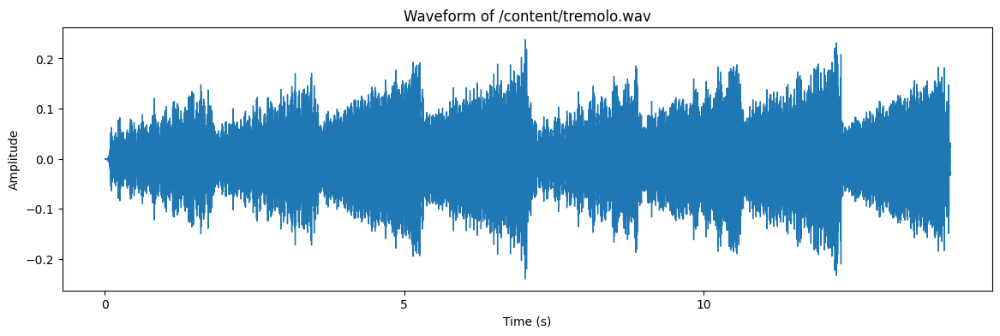

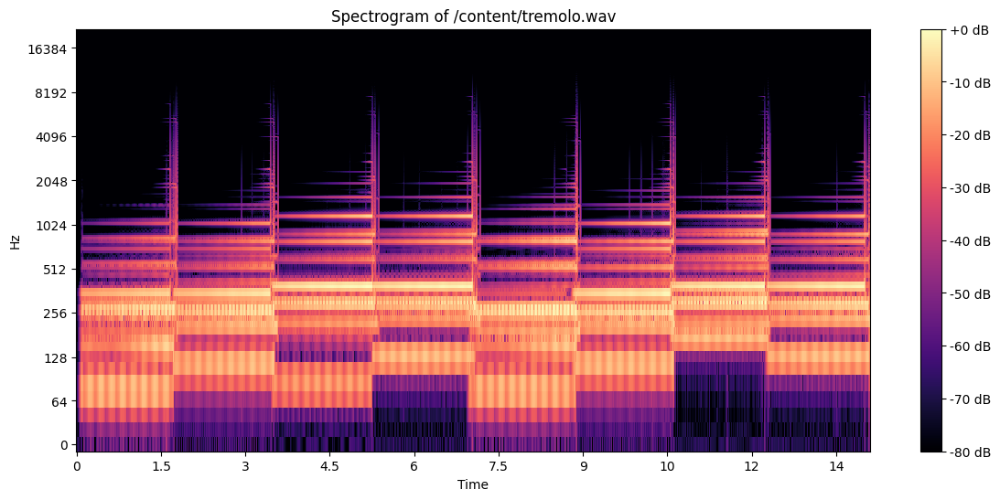

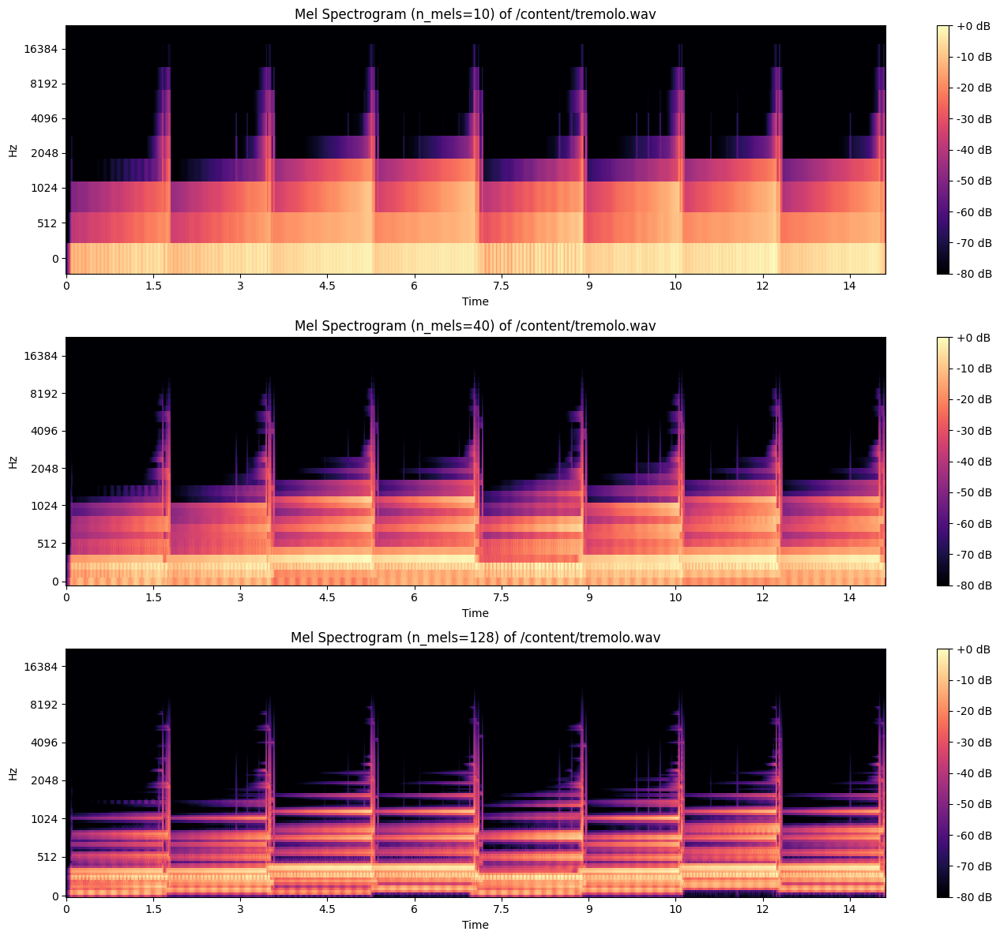


Comments:
 - The spectrogram reveals the frequency content of the signal over time.
 - The mel spectrograms with different numbers of mel filter banks show varying frequency resolution:
    * With fewer mel bands (e.g., n_mels=10), the spectral details are more coarse and smooth.
    * With a moderate number (e.g., n_mels=40), a balance between time-frequency resolution is achieved.
    * With a high number (e.g., n_mels=128), finer spectral details are visible, but the image may be noisier.
 - These differences help in selecting an appropriate number of mel filters for tasks such as audio classification or speech processing.

Analysis for: /content/violin_c.wav

Playing audio: /content/violin_c.wav


Sampling rate: 44100 Hz
Number of samples: 119543
Duration: 2.71 seconds


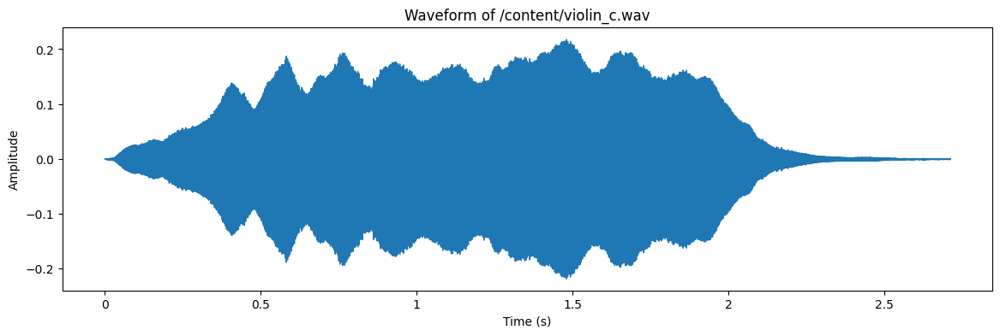

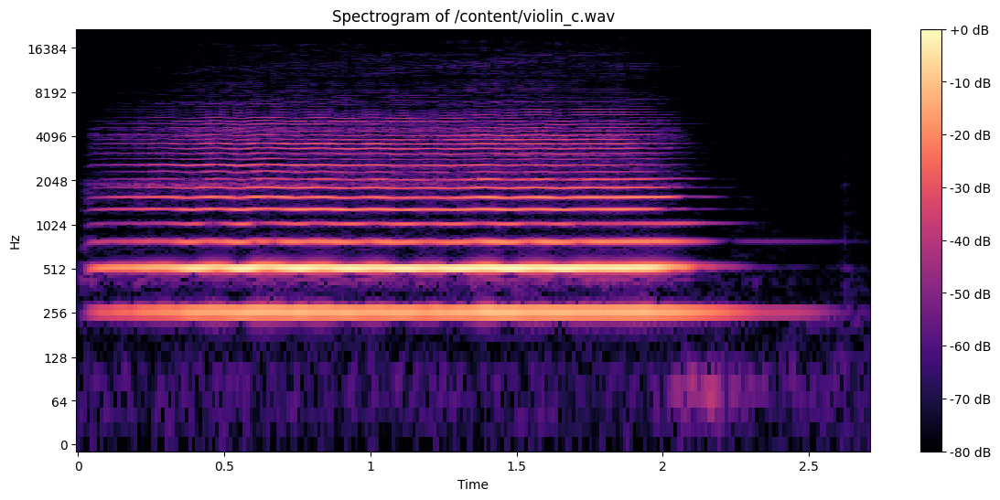

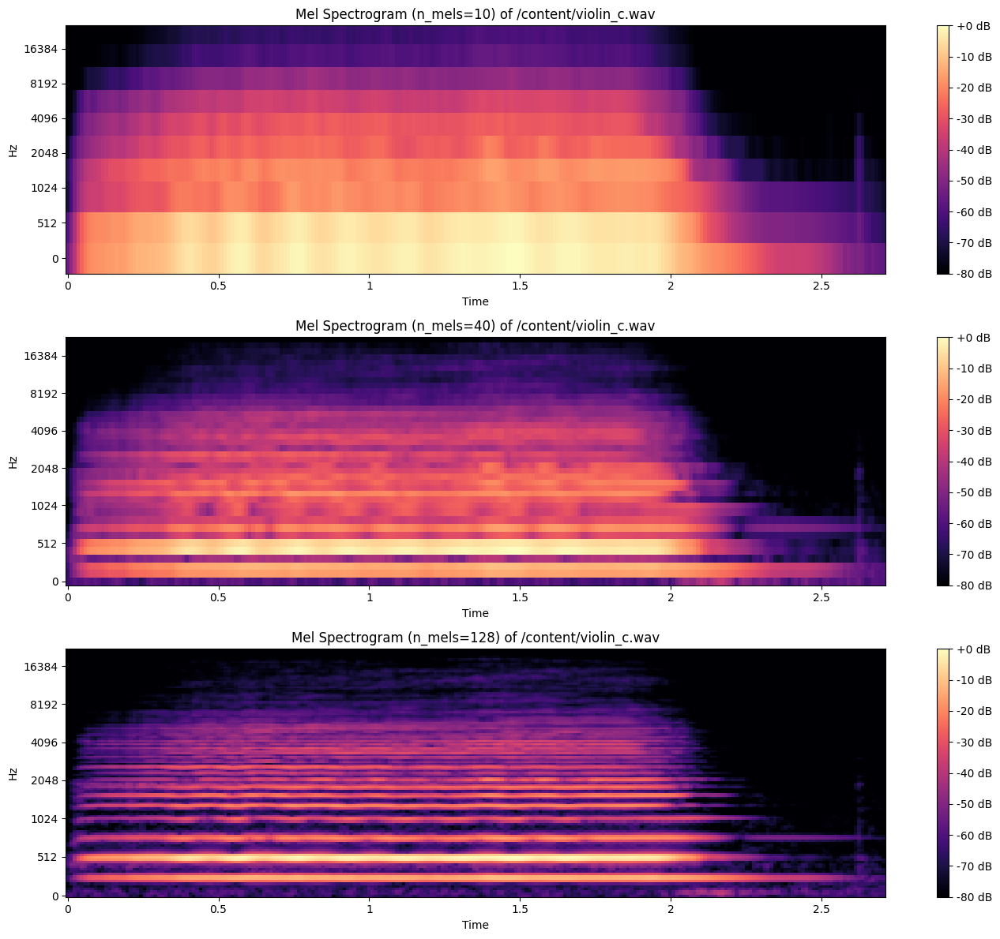


Comments:
 - The spectrogram reveals the frequency content of the signal over time.
 - The mel spectrograms with different numbers of mel filter banks show varying frequency resolution:
    * With fewer mel bands (e.g., n_mels=10), the spectral details are more coarse and smooth.
    * With a moderate number (e.g., n_mels=40), a balance between time-frequency resolution is achieved.
    * With a high number (e.g., n_mels=128), finer spectral details are visible, but the image may be noisier.
 - These differences help in selecting an appropriate number of mel filters for tasks such as audio classification or speech processing.


In [39]:
# Analyze both audio files
audio_files = ['/content/tremolo.wav', '/content/violin_c.wav']

for file in audio_files:
    print("\n"+"="*60)
    print(f"Analysis for: {file}")
    analyze_audio(file)

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
from scipy.io import wavfile
import warnings
warnings.filterwarnings('ignore')

In [41]:
# Define file paths
violin_file = "/content/violin_c.wav"
tremolo_file = "/content/tremolo.wav"

In [42]:
# Function to analyze and visualize audio files
def analyze_audio(file_path, title):
    print(f"\n{'='*50}")
    print(f"ANALYZING: {title}")
    print(f"{'='*50}")

    # a. Load the audio file
    print("a. Loading audio file...")
    samples, sample_rate = librosa.load(file_path, sr=None)  # sr=None to preserve original sample rate

    # b. Play the audio file
    print("b. Audio playback (would play in notebook environment)")
    # ipd.display(ipd.Audio(samples, rate=sample_rate))

    # c. Identify the sampling rate
    print(f"c. Sampling rate: {sample_rate} Hz")

    # d. Number of samples
    num_samples = len(samples)
    print(f"d. Number of samples: {num_samples}")

    # e. Calculate duration
    duration = num_samples / sample_rate
    print(f"e. Duration: {duration:.2f} seconds")

    # f. Visualize in time domain
    plt.figure(figsize=(14, 4))
    librosa.display.waveshow(samples, sr=sample_rate)
    plt.title(f"Time Domain Waveform - {title}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.tight_layout()
    plt.show()

    # g. Calculate and visualize spectrogram
    plt.figure(figsize=(14, 5))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(samples)), ref=np.max)
    librosa.display.specshow(D, y_axis='log', x_axis='time', sr=sample_rate)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Spectrogram - {title}")
    plt.tight_layout()
    plt.show()

    # h. Calculate and plot mel spectrograms with varying filter banks
    n_mels_values = [16, 64, 128]

    plt.figure(figsize=(16, 12))
    for i, n_mels in enumerate(n_mels_values):
        plt.subplot(3, 1, i+1)
        mel_spec = librosa.feature.melspectrogram(y=samples, sr=sample_rate, n_mels=n_mels)
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        librosa.display.specshow(mel_spec_db, y_axis='mel', x_axis='time',
                                sr=sample_rate, fmax=sample_rate/2)
        plt.colorbar(format='%+2.0f dB')
        plt.title(f"Mel Spectrogram - {title} (n_mels={n_mels})")

    plt.tight_layout()
    plt.show()

    return samples, sample_rate, num_samples, duration


ANALYZING: Violin C
a. Loading audio file...
b. Audio playback (would play in notebook environment)
c. Sampling rate: 44100 Hz
d. Number of samples: 119543
e. Duration: 2.71 seconds


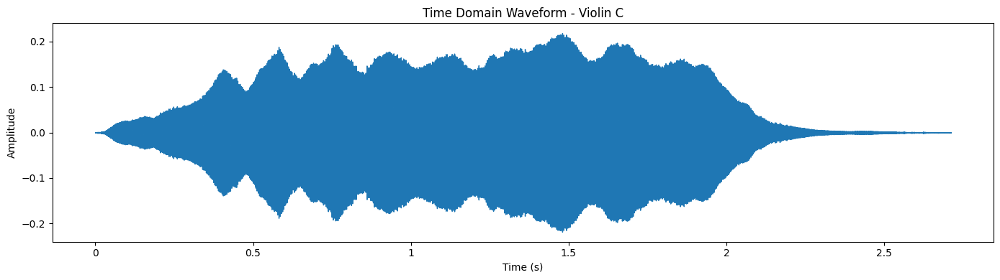

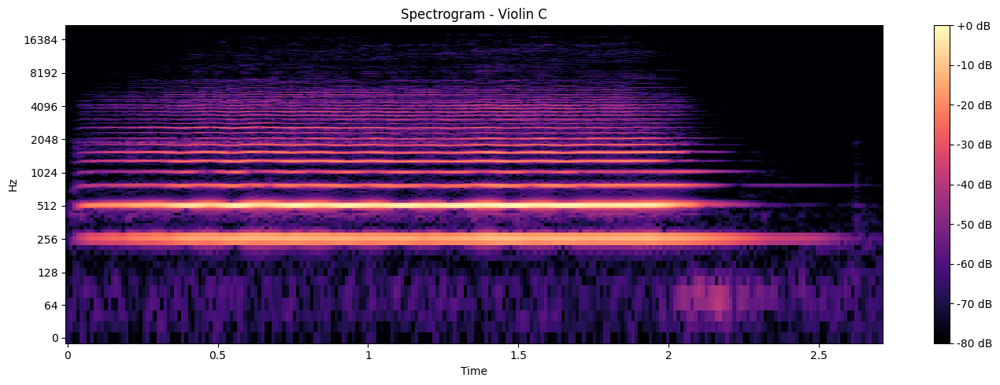

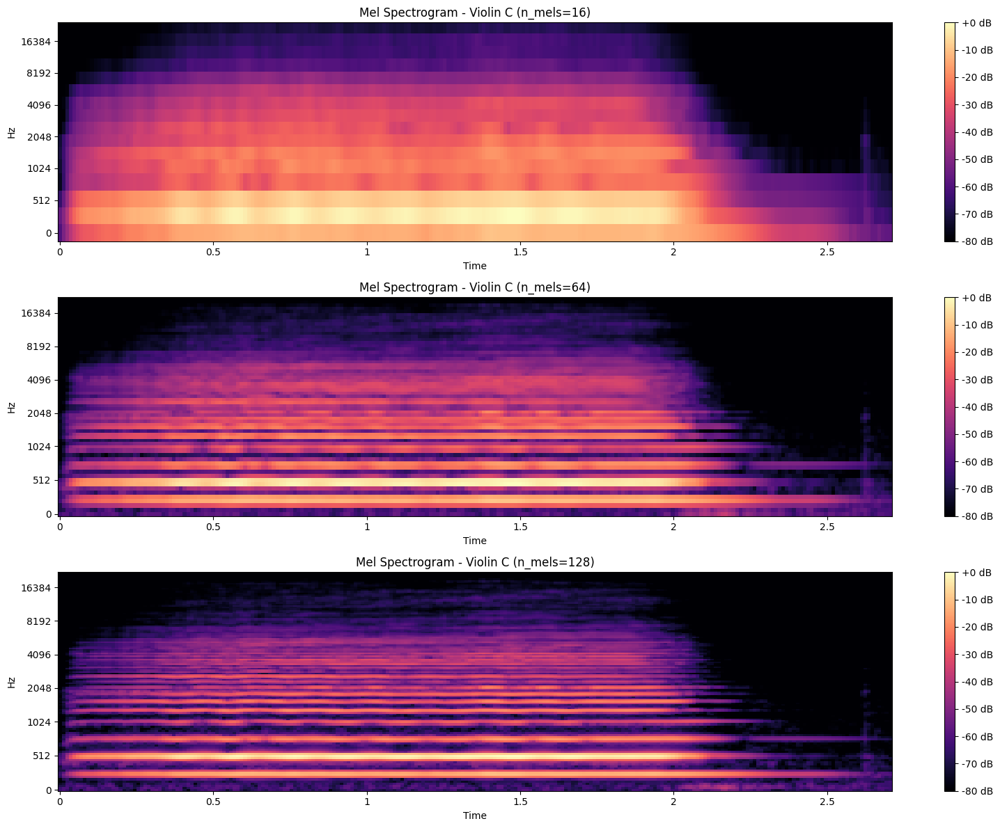


ANALYZING: Tremolo
a. Loading audio file...
b. Audio playback (would play in notebook environment)
c. Sampling rate: 44100 Hz
d. Number of samples: 622589
e. Duration: 14.12 seconds


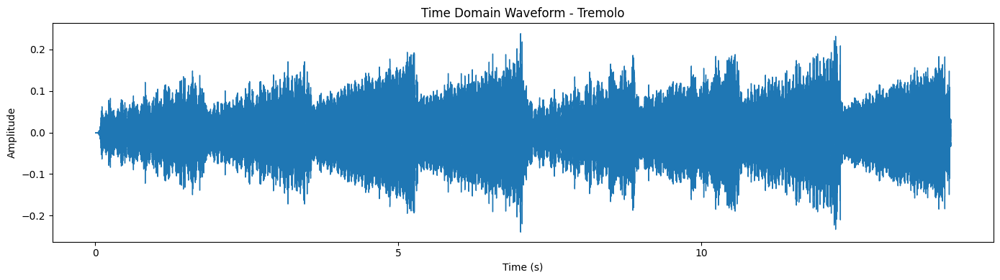

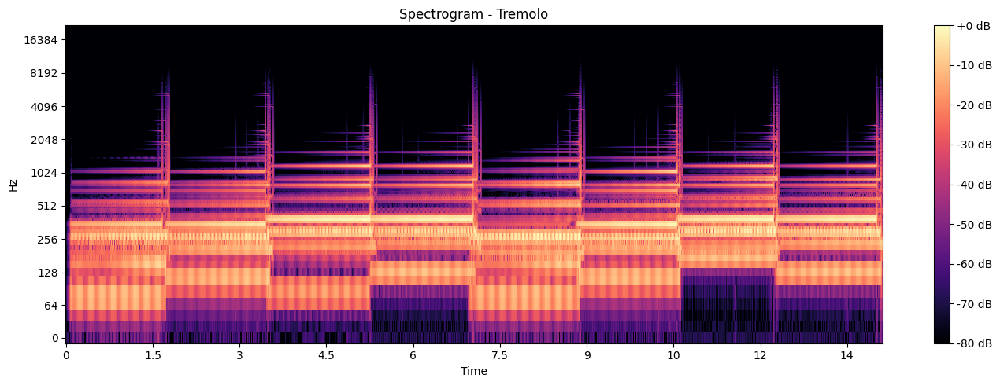

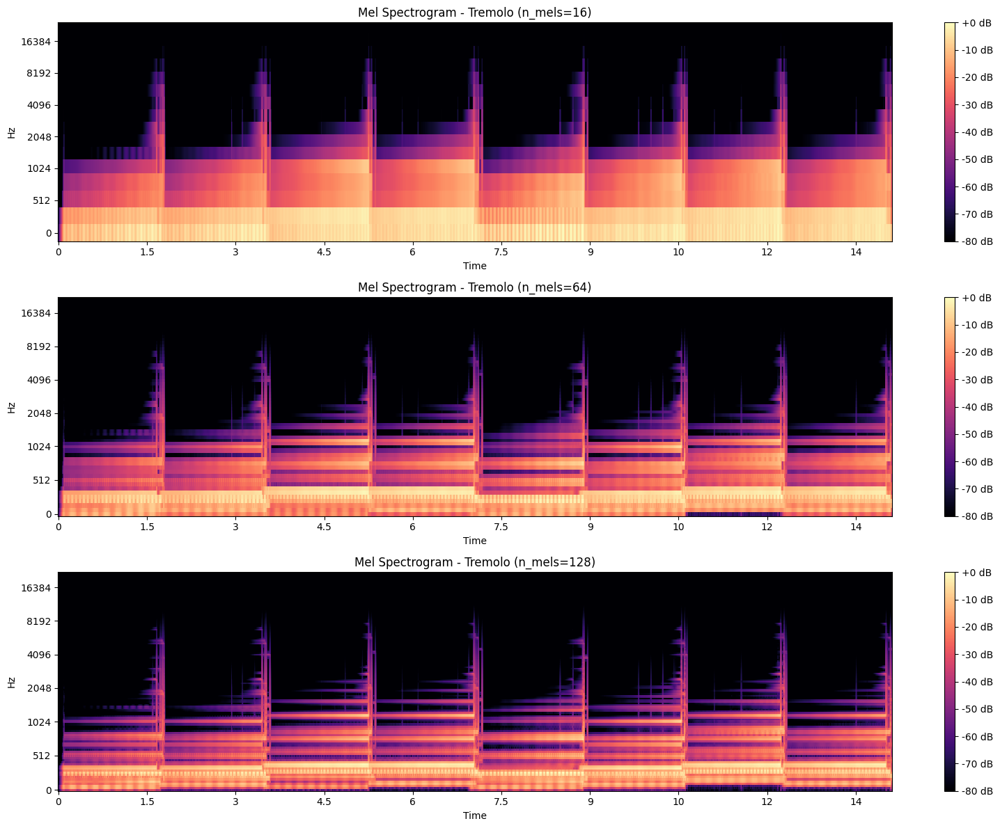



COMPARATIVE ANALYSIS
Violin sample rate: 44100 Hz | Tremolo sample rate: 44100 Hz
Violin duration: 2.71 seconds | Tremolo duration: 14.12 seconds


In [43]:
# Analyze both files
violin_samples, violin_sr, violin_num_samples, violin_duration = analyze_audio(violin_file, "Violin C")
tremolo_samples, tremolo_sr, tremolo_num_samples, tremolo_duration = analyze_audio(tremolo_file, "Tremolo")

# i. Comment on comparative results
print("\n")
print("="*50)
print("COMPARATIVE ANALYSIS")
print("="*50)

print(f"Violin sample rate: {violin_sr} Hz | Tremolo sample rate: {tremolo_sr} Hz")
print(f"Violin duration: {violin_duration:.2f} seconds | Tremolo duration: {tremolo_duration:.2f} seconds")

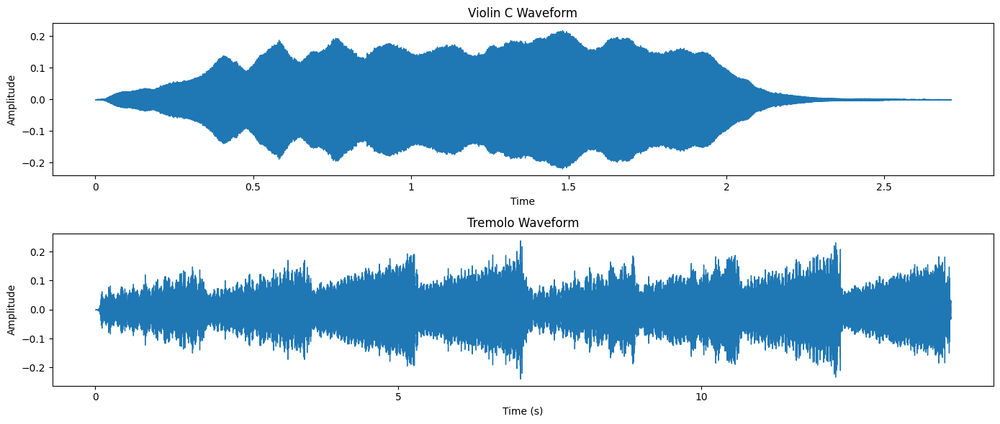

In [44]:
# Additional comparative visualization - both waveforms
plt.figure(figsize=(14, 6))
plt.subplot(2, 1, 1)
librosa.display.waveshow(violin_samples, sr=violin_sr)
plt.title("Violin C Waveform")
plt.ylabel("Amplitude")

plt.subplot(2, 1, 2)
librosa.display.waveshow(tremolo_samples, sr=tremolo_sr)
plt.title("Tremolo Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()

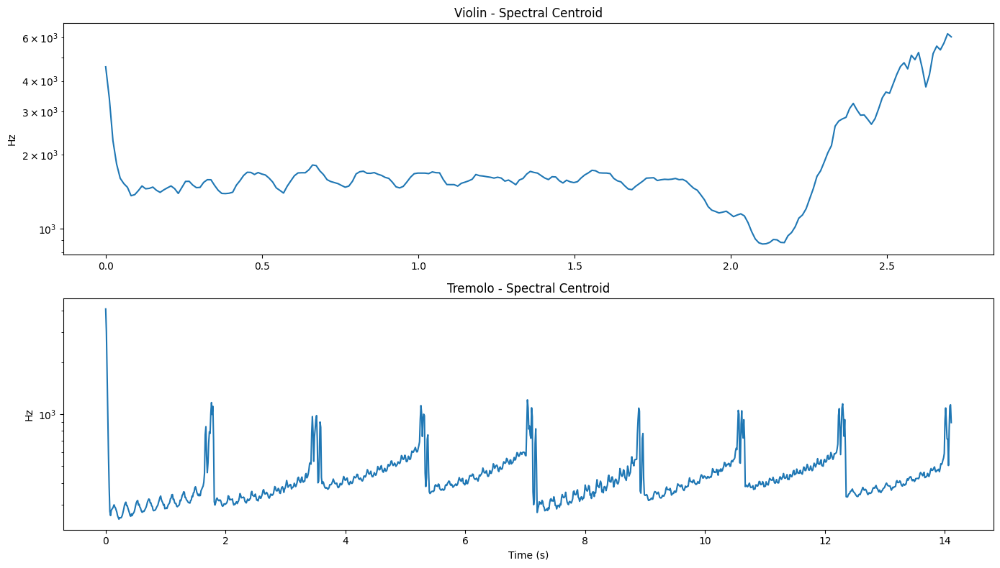

In [45]:
# Frequency content comparison
plt.figure(figsize=(14, 8))

# Violin spectral centroid
violin_cent = librosa.feature.spectral_centroid(y=violin_samples, sr=violin_sr)[0]
violin_times = librosa.times_like(violin_cent, sr=violin_sr)

plt.subplot(2, 1, 1)
plt.semilogy(violin_times, violin_cent)
plt.title('Violin - Spectral Centroid')
plt.ylabel('Hz')

# Tremolo spectral centroid
tremolo_cent = librosa.feature.spectral_centroid(y=tremolo_samples, sr=tremolo_sr)[0]
tremolo_times = librosa.times_like(tremolo_cent, sr=tremolo_sr)

plt.subplot(2, 1, 2)
plt.semilogy(tremolo_times, tremolo_cent)
plt.title('Tremolo - Spectral Centroid')
plt.xlabel('Time (s)')
plt.ylabel('Hz')

plt.tight_layout()
plt.show()

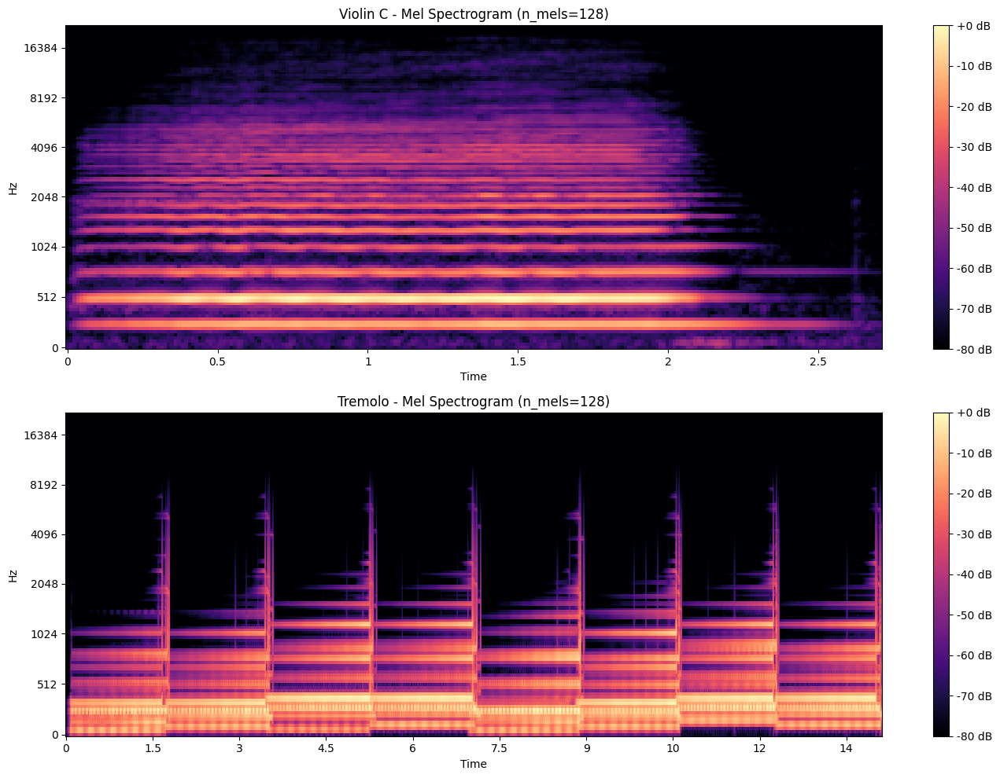


i. Comparative Analysis Comments:
   1. Time Domain: The violin shows a more regular pattern while the tremolo has amplitude modulation
   2. Spectral Content: The violin has clearer harmonics while the tremolo shows rapid modulations
   3. Mel Spectrograms: At higher filter banks, the tremolo's amplitude variations become more evident
   4. Lower mel filter banks (16) capture the overall timbral characteristics but miss finer details
   5. Higher mel filter banks (128) better represent the harmonic structure and temporal variations


In [46]:
# Create mel spectrograms with same settings for direct comparison
plt.figure(figsize=(14, 10))

# Violin mel spectrogram
plt.subplot(2, 1, 1)
violin_mel = librosa.feature.melspectrogram(y=violin_samples, sr=violin_sr, n_mels=128)
violin_mel_db = librosa.power_to_db(violin_mel, ref=np.max)
librosa.display.specshow(violin_mel_db, y_axis='mel', x_axis='time', sr=violin_sr)
plt.colorbar(format='%+2.0f dB')
plt.title("Violin C - Mel Spectrogram (n_mels=128)")

# Tremolo mel spectrogram
plt.subplot(2, 1, 2)
tremolo_mel = librosa.feature.melspectrogram(y=tremolo_samples, sr=tremolo_sr, n_mels=128)
tremolo_mel_db = librosa.power_to_db(tremolo_mel, ref=np.max)
librosa.display.specshow(tremolo_mel_db, y_axis='mel', x_axis='time', sr=tremolo_sr)
plt.colorbar(format='%+2.0f dB')
plt.title("Tremolo - Mel Spectrogram (n_mels=128)")

plt.tight_layout()
plt.show()

print("\ni. Comparative Analysis Comments:")
print("   1. Time Domain: The violin shows a more regular pattern while the tremolo has amplitude modulation")
print("   2. Spectral Content: The violin has clearer harmonics while the tremolo shows rapid modulations")
print("   3. Mel Spectrograms: At higher filter banks, the tremolo's amplitude variations become more evident")
print("   4. Lower mel filter banks (16) capture the overall timbral characteristics but miss finer details")
print("   5. Higher mel filter banks (128) better represent the harmonic structure and temporal variations")